In [1]:
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
!tar -xf images.tar.gz
!tar -xf annotations.tar.gz

URL transformed to HTTPS due to an HSTS policy
--2025-03-19 12:06:38--  https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
connected. to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... 
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://thor.robots.ox.ac.uk/pets/images.tar.gz [following]
--2025-03-19 12:06:39--  https://thor.robots.ox.ac.uk/pets/images.tar.gz
Resolving thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)... 129.67.95.98
connected. to thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)|129.67.95.98|:443... 
HTTP request sent, awaiting response... 200 OK
Length: 791918971 (755M) [application/octet-stream]
Saving to: ‘images.tar.gz.5’

images.tar.gz.5     100%[===================>] 755.23M  10.6MB/s    in 99s     

2025-03-19 12:08:19 (7.61 MB/s) - ‘images.tar.gz.5’ saved [791918971/791918971]

URL transformed to HTTPS due to an HSTS policy
--2025-03-19 12:08:19--  http

7390


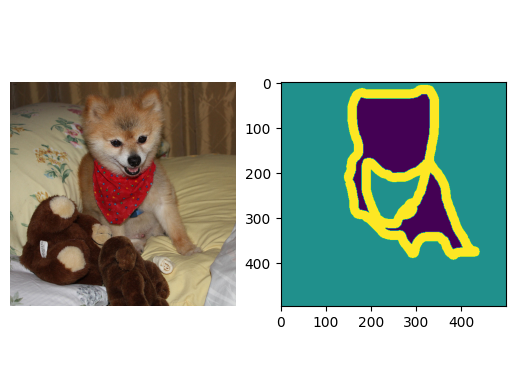

In [6]:
import os
import random

input_dir = "images/"
target_dir = "annotations/trimaps/"

input_img_paths = sorted(
    [os.path.join(input_dir, fname)
     for fname in os.listdir(input_dir)
     if fname.endswith(".jpg")])
target_paths = sorted(
    [os.path.join(target_dir, fname)
     for fname in os.listdir(target_dir)
     if fname.endswith(".png") and not fname.startswith(".")])

import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img, img_to_array
i = random.randint(1, 7390)
print(len(input_img_paths))
plt.axis("off")
plt.subplot(1,2,1)
plt.imshow(load_img(input_img_paths[i]))

def display_target(target_array):
    normalized_array = (target_array.astype("uint8") - 1) * 127
    plt.axis("off")
    plt.subplot(1,2,2)
    plt.imshow(normalized_array[:, :, 0])

img = img_to_array(load_img(target_paths[i], color_mode="grayscale"))
display_target(img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


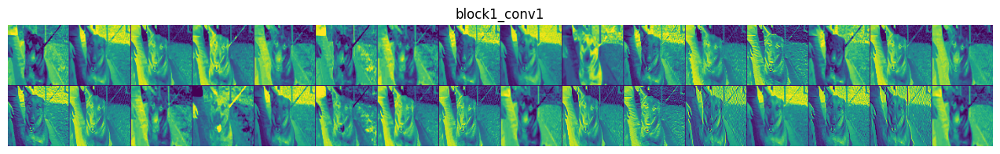

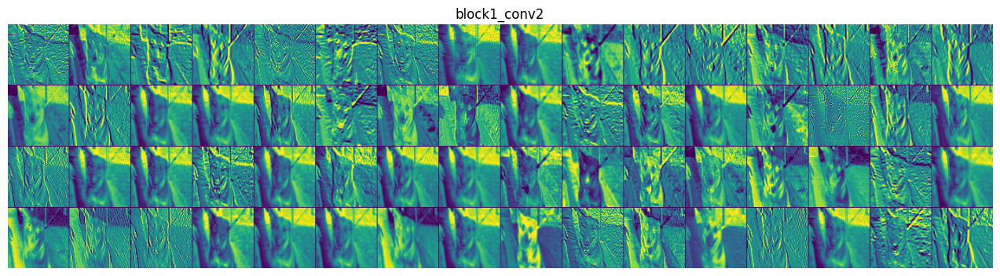

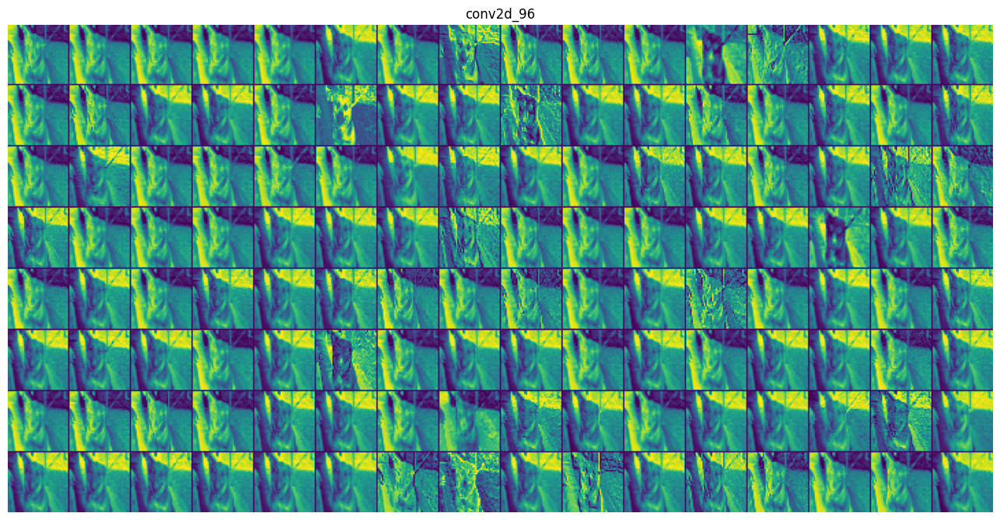

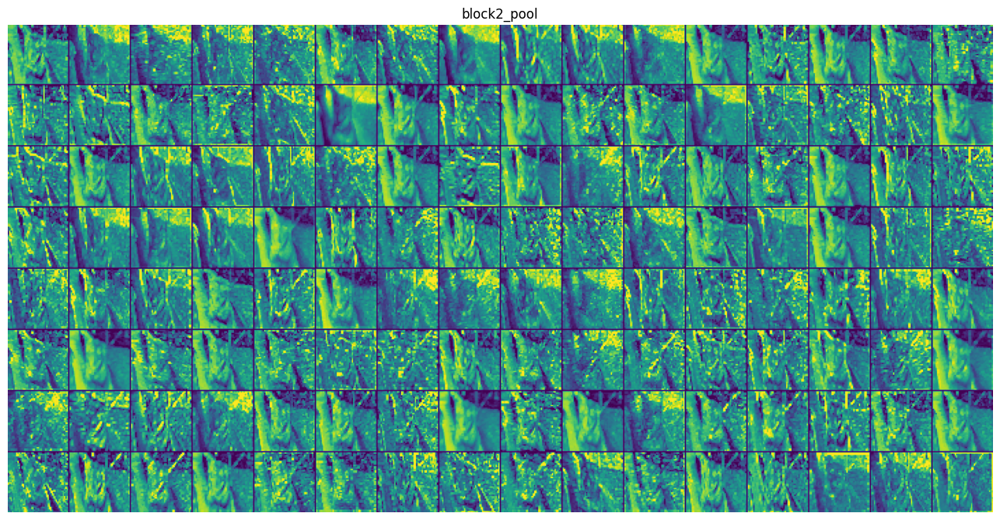

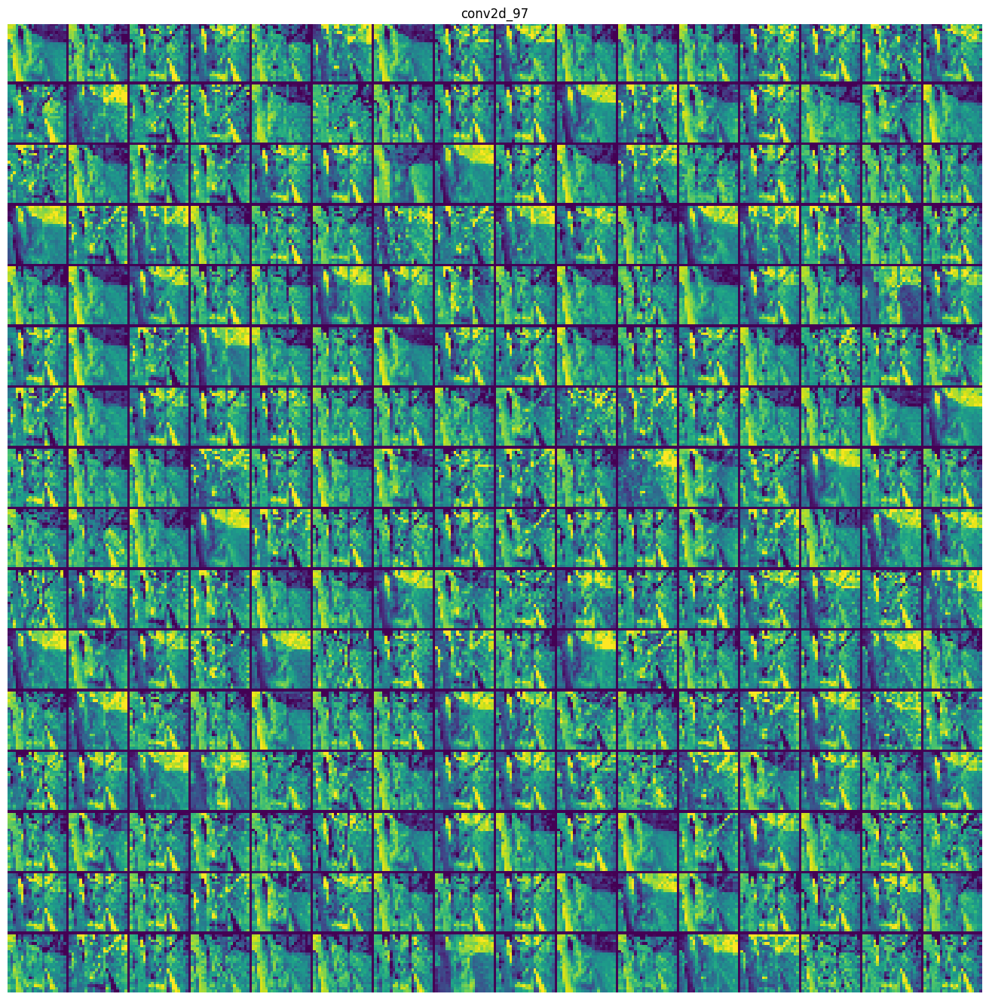

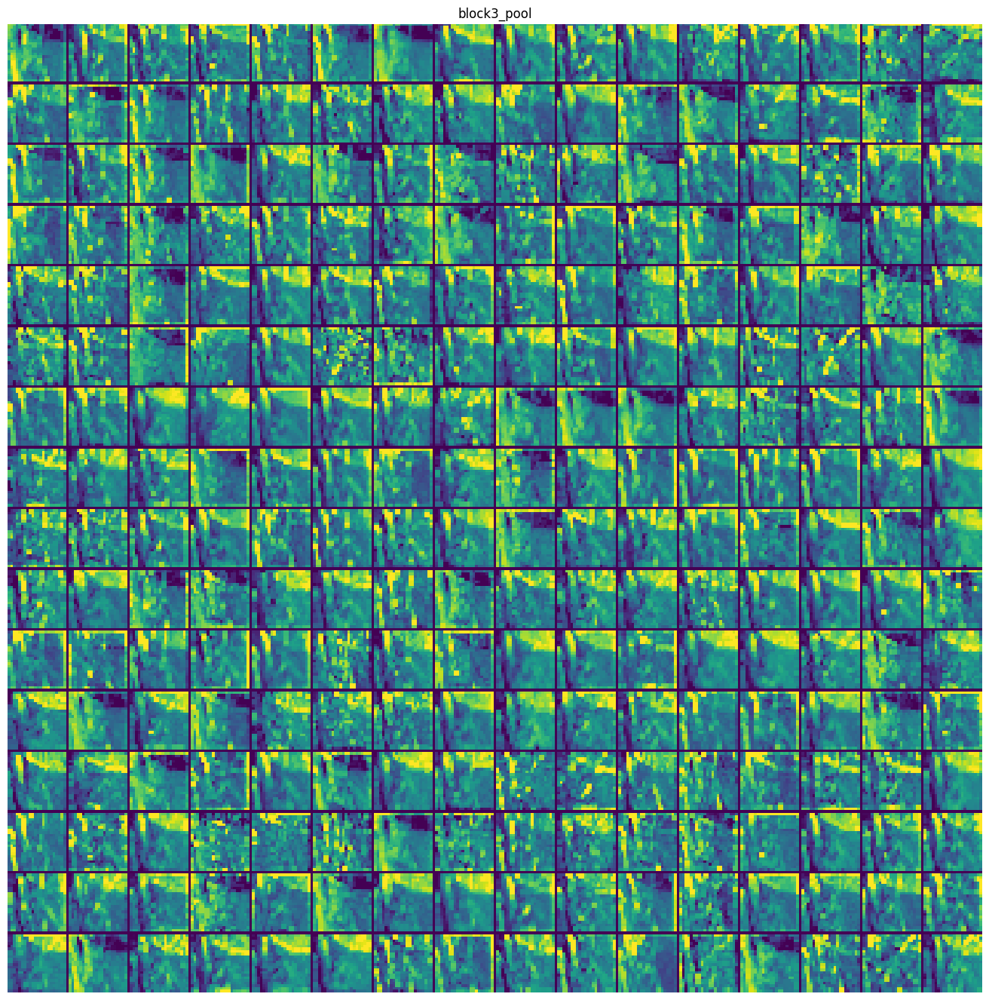

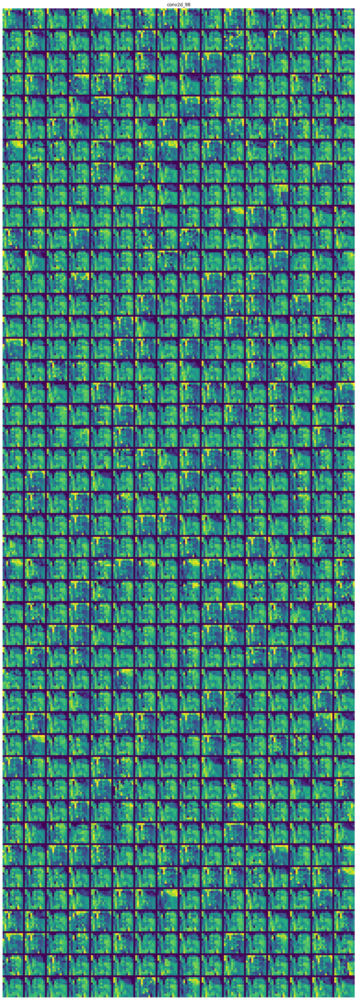

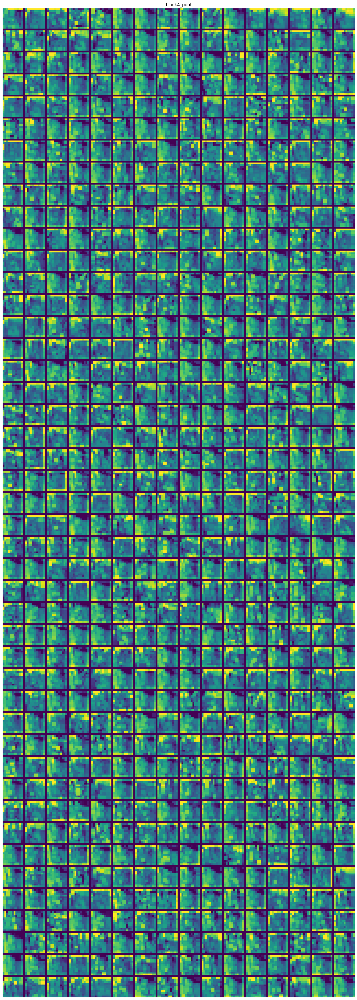

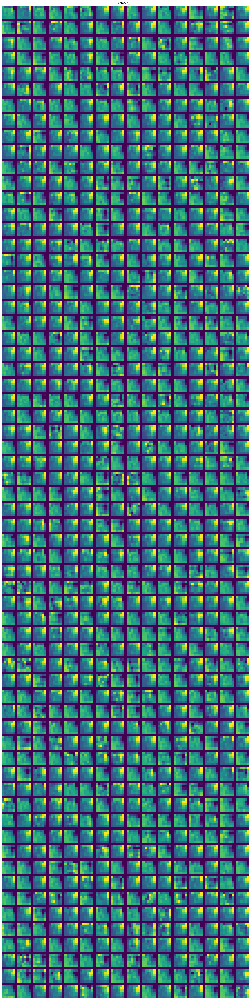

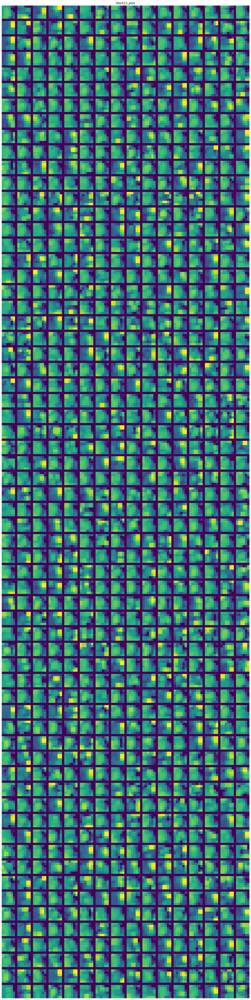

In [44]:
from tensorflow import keras
import tensorflow_datasets as tfds
dataset_name = "cats_vs_dogs"
(train_ds, val_ds, test_ds), dataset_info = tfds.load(dataset_name, split=["train[:70%]", "train[70%:85%]", "train[85%:]"], as_supervised=True, with_info=True)
model = keras.applications.xception.Xception(weights="imagenet", include_top=False)

from tensorflow.keras import layers

layer_outputs = [layer.output for layer in model.layers if isinstance(layer, (keras.layers.Conv2D, keras.layers.MaxPooling2D))]
layer_names = [layer.name for layer in model.layers if isinstance(layer, (keras.layers.Conv2D, keras.layers.MaxPooling2D))]

activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

random_image = tf.image.resize(random_image, (180, 180))
img_tensor = get_img_array(img_path, target_size=(180, 180))
activations = activation_model.predict(random_image)

images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            if channel_index >= n_features:
                break  # Avoid out-of-bounds errors
            
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= (channel_image.std() + 1e-5)  # Avoid division by zero
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1): (row + 1) * size + row] = channel_image
    
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")
    plt.show()

block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d_96
block3_sepconv1
block3_sepconv2
conv2d_97
block4_sepconv1
block4_sepconv2
conv2d_98
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_99
block14_sepconv1
block14_sepconv2
132
Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Proce

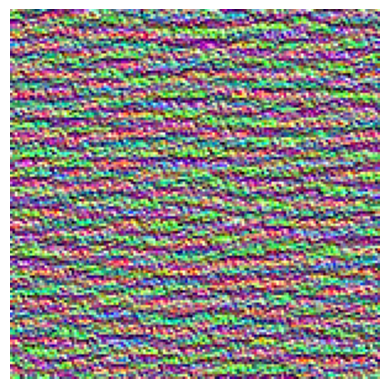

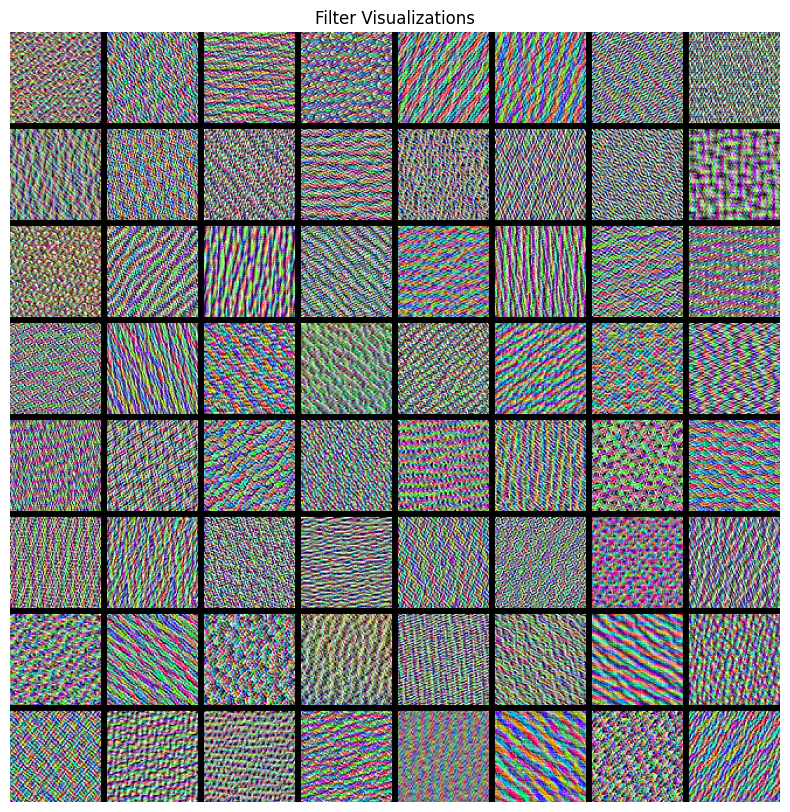

In [48]:
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)):
        print(layer.name)
print(len(model.layers))
layer_name = "block3_sepconv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
activation = feature_extractor(
    keras.applications.xception.preprocess_input(img_tensor)
)

import tensorflow as tf

def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

img_width = 200
img_height = 200

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

n = 8 
margin = 5 
img_width = 128 
img_height = 128 

all_images = []
for filter_index in range(n * n):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(generate_filter_pattern(filter_index))
    all_images.append(image)

cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((height, width, 3), dtype="uint8")

for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        stitched_filters[
            i * (cropped_height + margin): i * (cropped_height + margin) + cropped_height,
            j * (cropped_width + margin): j * (cropped_width + margin) + cropped_width,
            :
        ] = image

plt.figure(figsize=(10, 10))
plt.imshow(stitched_filters)
plt.axis("off")
plt.title("Filter Visualizations")
plt.show()

In [95]:
dataset_name = "cats_vs_dogs"
(train_ds, val_ds, test_ds), dataset_info = tfds.load(
    dataset_name, split=["train[:70%]", "train[70%:85%]", "train[85%:]"], as_supervised=True, with_info=True)
random_image, random_label = next(iter(train_ds.shuffle(1000).take(1)))
def get_img_array(img, target_size):
    image_resized = tf.image.resize(img, target_size)
    array = keras.utils.img_to_array(image_resized)
    array = np.expand_dims(array, axis=0)
    array = keras.applications.xception.preprocess_input(array)
    return array

random_image_array = get_img_array(random_image, target_size=(299, 299))

#random_image, random_label = next(iter(test_ds))
#random_image_array = image_array.numpy()

# Make a prediction
preds = model.predict(random_image_array)
decoded_preds = keras.applications.xception.decode_predictions(preds, top=3)[0]
print("Predictions:", decoded_preds)

# Get the index of the highest predicted class
top_pred_index = np.argmax(preds[0])

# Define Grad-CAM visualization
last_conv_layer_name = "block14_sepconv2_act"
classifier_layer_names = ["avg_pool", "predictions"]

# Get the last convolutional layer
last_conv_layer = model.get_layer(last_conv_layer_name)
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

# Define classifier model from last conv layer to final predictions
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
for layer_name in classifier_layer_names:
    x = model.get_layer(layer_name)(x)
classifier_model = keras.Model(classifier_input, x)

# Compute Grad-CAM
with tf.GradientTape() as tape:
    last_conv_layer_output = last_conv_layer_model(random_image_array)
    tape.watch(last_conv_layer_output)
    preds = classifier_model(last_conv_layer_output)
    top_class_channel = preds[:, top_pred_index]

grads = tape.gradient(top_class_channel, last_conv_layer_output)
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()
last_conv_layer_output = last_conv_layer_output.numpy()[0]

for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]

heatmap = np.mean(last_conv_layer_output, axis=-1)
heatmap = np.maximum(heatmap, 0)  # Apply ReLU to ensure non-negative values
heatmap /= np.max(heatmap)  # Normalize between 0 and 1

# Resize heatmap to match input image size
heatmap = np.uint8(255 * heatmap)
jet = plt.colormaps["jet"]
jet_colors = jet(np.arange(256))[:, :3]  # Get jet colormap
jet_heatmap = jet_colors[heatmap]

# Resize heatmap to match the input image size
jet_heatmap = keras.utils.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((299, 299))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)

# Superimpose heatmap on original image
superimposed_img = jet_heatmap * 0.01 + random_image_array[0]  # Blend images
superimposed_img = keras.utils.array_to_img(superimposed_img)

# Display the result
plt.imshow(superimposed_img)
plt.axis("off")
plt.title(f"Class Activation Map for {decoded_preds[0][1]}")
plt.show()

ValueError: output array is read-only